#Big Data Project 


- Dana Baranava - Student ID: db106654
- Oleksandra Tarasenko - Student ID: ot130979
- Maria Baranovskaya - Student ID: mb130974


In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [0]:
# File location and type
file_location = "/FileStore/tables/Electric_Vehicle-1.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

VIN (1-10),County,City,State,Postal_Code,Model_Year,Make,Model,Electric_Vehicle_Type,Clean_Alternative_Fuel_Vehicle_Eligibility,Electric_Range,Base_MSRP,Legislative_District,DOL_Vehicle_ID,Vehicle_Location,Electric_Utility,2020_Census_Tract
5YJ3E1EA0K,Thurston,Tumwater,WA,98512,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,22,242565116,POINT (-122.91310169999997 47.01359260000004),PUGET SOUND ENERGY INC,53067010910
1N4BZ1DV4N,Island,Clinton,WA,98236,2022,NISSAN,LEAF,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not been researched,0,0,10,183272785,POINT (-122.35936399999997 47.97965520000008),PUGET SOUND ENERGY INC,53029972000
5YJ3E1EA0L,Snohomish,Snohomish,WA,98290,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,266,0,44,112552366,POINT (-122.09150499999998 47.91555500000004),PUGET SOUND ENERGY INC,53061052502
5YJ3E1EBXL,King,Seattle,WA,98134,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,11,6336319,POINT (-122.32981499999994 47.579810000000066),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),53033009300
5YJSA1CP0D,Snohomish,Edmonds,WA,98020,2013,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208,69900,21,186212960,POINT (-122.37507 47.80807000000004),PUGET SOUND ENERGY INC,53061050403
WBY7Z8C5XJ,Chelan,Manson,WA,98831,2018,BMW,I3,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,97,0,12,215122904,POINT (-120.1531 47.88550500000008),PUD NO 1 OF CHELAN COUNTY,53007960400
5YJ3E1EC1L,Snohomish,Marysville,WA,98271,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,38,110992472,POINT (-122.17138469999998 48.10433000000006),PUGET SOUND ENERGY INC,53061053102
WA1F2AFY7M,Snohomish,Edmonds,WA,98026,2021,AUDI,Q5 E,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,18,0,21,138909032,POINT (-122.33568499999996 47.803720000000055),PUGET SOUND ENERGY INC,53061050300
JTDKARFPXK,Thurston,Olympia,WA,98501,2019,TOYOTA,PRIUS PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,25,0,22,272310279,POINT (-122.89691999999997 47.04353500000008),PUGET SOUND ENERGY INC,53067010700
1N4AZ1CP2J,Thurston,Lacey,WA,98503,2018,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,151,0,22,235573929,POINT (-122.82849999999996 47.036460000000034),PUGET SOUND ENERGY INC,53067011422


In [0]:
# Create a view or table

temp_table_name = "Electric_Vehicle_csv"

df.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Query the created temp table in a SQL cell */

select * from `Electric_Vehicle_csv`

VIN (1-10),County,City,State,Postal_Code,Model_Year,Make,Model,Electric_Vehicle_Type,Clean_Alternative_Fuel_Vehicle_Eligibility,Electric_Range,Base_MSRP,Legislative_District,DOL_Vehicle_ID,Vehicle_Location,Electric_Utility,2020_Census_Tract
5YJ3E1EA0K,Thurston,Tumwater,WA,98512,2019,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,220,0,22,242565116,POINT (-122.91310169999997 47.01359260000004),PUGET SOUND ENERGY INC,53067010910
1N4BZ1DV4N,Island,Clinton,WA,98236,2022,NISSAN,LEAF,Battery Electric Vehicle (BEV),Eligibility unknown as battery range has not been researched,0,0,10,183272785,POINT (-122.35936399999997 47.97965520000008),PUGET SOUND ENERGY INC,53029972000
5YJ3E1EA0L,Snohomish,Snohomish,WA,98290,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,266,0,44,112552366,POINT (-122.09150499999998 47.91555500000004),PUGET SOUND ENERGY INC,53061052502
5YJ3E1EBXL,King,Seattle,WA,98134,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,322,0,11,6336319,POINT (-122.32981499999994 47.579810000000066),CITY OF SEATTLE - (WA)|CITY OF TACOMA - (WA),53033009300
5YJSA1CP0D,Snohomish,Edmonds,WA,98020,2013,TESLA,MODEL S,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,208,69900,21,186212960,POINT (-122.37507 47.80807000000004),PUGET SOUND ENERGY INC,53061050403
WBY7Z8C5XJ,Chelan,Manson,WA,98831,2018,BMW,I3,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,97,0,12,215122904,POINT (-120.1531 47.88550500000008),PUD NO 1 OF CHELAN COUNTY,53007960400
5YJ3E1EC1L,Snohomish,Marysville,WA,98271,2020,TESLA,MODEL 3,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,308,0,38,110992472,POINT (-122.17138469999998 48.10433000000006),PUGET SOUND ENERGY INC,53061053102
WA1F2AFY7M,Snohomish,Edmonds,WA,98026,2021,AUDI,Q5 E,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,18,0,21,138909032,POINT (-122.33568499999996 47.803720000000055),PUGET SOUND ENERGY INC,53061050300
JTDKARFPXK,Thurston,Olympia,WA,98501,2019,TOYOTA,PRIUS PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,25,0,22,272310279,POINT (-122.89691999999997 47.04353500000008),PUGET SOUND ENERGY INC,53067010700
1N4AZ1CP2J,Thurston,Lacey,WA,98503,2018,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,151,0,22,235573929,POINT (-122.82849999999996 47.036460000000034),PUGET SOUND ENERGY INC,53067011422


In [0]:
# With this registered as a temp view, it will only be available to this particular notebook. If you'd like other users to be able to query this table, you can also create a table from the DataFrame.
# Once saved, this table will persist across cluster restarts as well as allow various users across different notebooks to query this data.
# To do so, choose your table name and uncomment the bottom line.

permanent_table_name = "Electric_Vehicle_csv"

# df.write.format("parquet").saveAsTable(permanent_table_name)

Make,count
TESLA,61704
NISSAN,13135
CHEVROLET,11392
FORD,6860
BMW,5891
KIA,5486
TOYOTA,4865
VOLKSWAGEN,3520
VOLVO,3211
AUDI,2718


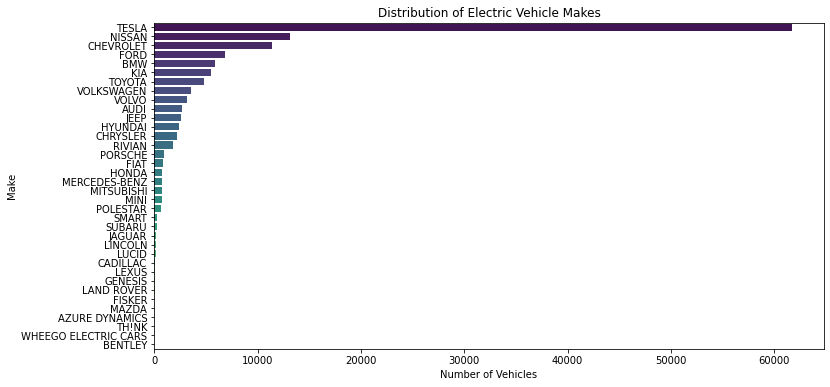

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator
import seaborn as sns
import pyspark.sql.functions as F 
import matplotlib.pyplot as plt

# Count the number of electric vehicles by make
make_counts = df.groupBy("Make").count().orderBy("count", ascending=False)
display(make_counts)

# Visualize the distribution of electric vehicle makes
plt.figure(figsize=(12, 6))
sns.barplot(x="count", y="Make", data=make_counts.toPandas(), palette="viridis")
plt.title("Distribution of Electric Vehicle Makes")
plt.xlabel("Number of Vehicles")
plt.ylabel("Make")
display(plt.show())

This graph visualizes the distribution of electric vehicle brands. You can easily see that the most Tesla cars were produced - 61808, in second place are NISSAN - 13150 cars, and in 3rd place are CHEVROLET - 11437 cars. The remaining car brands produced less than 6,000 cars.

Electric_Vehicle_Type,count
Battery Electric Vehicle (BEV),103682
Plug-in Hybrid Electric Vehicle (PHEV),31060
null,296


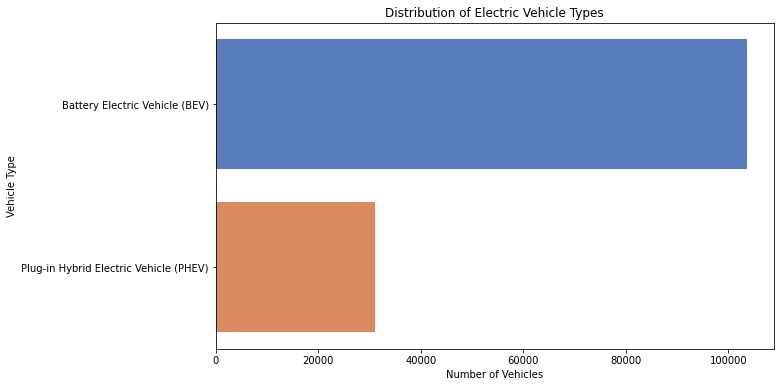

In [0]:
# Analyze the distribution of electric vehicle types
vehicle_type_counts = df.groupBy("Electric_Vehicle_Type").count().orderBy("count", ascending=False)
display(vehicle_type_counts)

# Visualize the distribution of electric vehicle types
plt.figure(figsize=(10, 6))
sns.barplot(x="count", y="Electric_Vehicle_Type", data=vehicle_type_counts.toPandas(), palette="muted")
plt.title("Distribution of Electric Vehicle Types")
plt.xlabel("Number of Vehicles")
plt.ylabel("Vehicle Type")
display(plt.show())

This visualization shows the distribution between engine types. According to the visualization data, we found that more Battery Electric Vehicle (BEV) was produced - 103882. And Plug-in Hybrid Electric Vehicle (PHEV) - 31156.

In [0]:
%sql
SELECT
    Model_Year,
    Electric_Vehicle_Type,
    COUNT(*) AS Vehicle_Count
FROM
  Electric_Vehicle_csv
WHERE
    Electric_Vehicle_Type IN ('Battery Electric Vehicle (BEV)', 'Plug-in Hybrid Electric Vehicle (PHEV)')
    AND Clean_Alternative_Fuel_Vehicle_Eligibility = 'Clean Alternative Fuel Vehicle Eligible'
GROUP BY
    Model_Year, Electric_Vehicle_Type
ORDER BY
    Model_Year, Electric_Vehicle_Type;


Model_Year,Electric_Vehicle_Type,Vehicle_Count
1997,Battery Electric Vehicle (BEV),1
1998,Battery Electric Vehicle (BEV),1
1999,Battery Electric Vehicle (BEV),4
2000,Battery Electric Vehicle (BEV),9
2002,Battery Electric Vehicle (BEV),2
2003,Battery Electric Vehicle (BEV),1
2008,Battery Electric Vehicle (BEV),20
2010,Battery Electric Vehicle (BEV),20
2010,Plug-in Hybrid Electric Vehicle (PHEV),3
2011,Battery Electric Vehicle (BEV),738


Databricks visualization. Run in Databricks to view.

The graph shows sales of electric vehicles and plug-in hybrid electric vehicles (PHEVs) from 2000 to 2023. Sales of electric vehicles (BEVs) and PHEVs have increased dramatically in recent years. It is also possible to observe a large decline in the impact of covid-19. The graph shows that BEV sales are growing faster than PHEV sales. In 2020, BEV sales are 9.5 thousand and PHEV sales are 485.

In [0]:
%sql
select Model_Year, count(Model)
FROM Electric_Vehicle_csv
GROUP BY Model_Year;

Model_Year,count(Model)
2018,14313
2015,4916
2023,22190
2022,27912
2013,4590
null,0
2014,3589
2019,10556
1998,1
2020,11123


Databricks visualization. Run in Databricks to view.

On this graph we can see that the smallest number of cars was in the period before 2010, and then a sharp increase began, which reached a peak in 2022. In 2023, a little more than 20,000 were produced, which is less than in 2022; data for 2024 has not yet been updated.

In [0]:
%sql
SELECT Model_Year, Make, COUNT(Make) AS MakeCount
FROM Electric_Vehicle_csv
GROUP BY Model_Year, Make

Model_Year,Make,MakeCount
2019,KIA,676
2019,HONDA,82
2013,FORD,634
2022,MITSUBISHI,85
2018,MERCEDES-BENZ,54
2012,NISSAN,592
2021,PORSCHE,166
2020,PORSCHE,155
2020,LINCOLN,28
2023,POLESTAR,186


Databricks visualization. Run in Databricks to view.

Since 2011, Nissan and Chevrolet have been the main ones on the market. and then every year more and more of them were replaced by adze. The market saw its maximum in 2020, because Tesla occupied more than 60% of the market. and became absolute leaders.

In [0]:
%sql
WITH RankedModels AS (
  SELECT Model_Year, Model, COUNT(Model) AS ModelCount, RANK() OVER (PARTITION BY Model_Year ORDER BY COUNT(Model) DESC) AS ModelRank
  FROM Electric_Vehicle_csv
  GROUP BY Model_Year, Model
)

SELECT Model_Year, Model, ModelCount
FROM RankedModels
WHERE ModelRank <= 5;


Model_Year,Model,ModelCount
null,null,0
1997,S-10 PICKUP,1
1998,RANGER,1
1999,RANGER,4
2000,RANGER,9
2002,RAV4,2
2003,RAV4,1
2008,ROADSTER,20
2010,ROADSTER,20
2010,WHEEGO,3


Databricks visualization. Run in Databricks to view.

Since mass production of cars began to develop actively after 2010, you can see every year more and more popular brands that were released this year. for example, in 2012 the most popular were: Leaf - 36.7%, Volt - 29.7%, Prius Plug In - 23.1% and Model S - around 8%. in 2011, the main part of the market was made up of the Leaf and Volt models, and until 2019 they held a significant part of the market. Also during these years, the Tesla model S gained popularity. Since 2018, the majority of the market has been occupied by Model 3. However, since 2020, the new Model Y released has displaced Model 3. The trend for models lasts on average from 5 to 7 years.

In [0]:
%sql
SELECT State, COUNT(Model) AS ModelCount
FROM Electric_Vehicle_csv
GROUP BY State;

State,ModelCount
AZ,9
VA,33
null,0
CA,90
IL,7
WA,134183
KS,4
AP,1
SC,6
DC,5


Databricks visualization. Run in Databricks to view.

Despite the fact that electric cars are registered almost throughout America. The graph shows that the bulk is concentrated in Washington. This may be because drivers who buy an electric car in Washington are also eligible for eight different tax breaks. In addition, Washington has some of the lowest electricity prices in the United States, at just over 8.3 cents per kilowatt-hour.

In [0]:
%sql
SELECT Model_Year, Make, MODEL, MAX(Electric_Range) AS Max_Electric_Range
FROM Electric_Vehicle_csv
WHERE Electric_Range IS NOT NULL
  AND Electric_Range > 0
GROUP BY Model_Year, Make, MODEL;


Model_Year,Make,MODEL,Max_Electric_Range
2016,PORSCHE,CAYENNE,14
2023,MINI,COUNTRYMAN,17
2018,VOLVO,XC90,19
2018,BMW,I3,114
2016,BMW,X5,14
2018,TESLA,MODEL S,249
2016,TESLA,MODEL S,210
2021,AUDI,E-TRON,222
2015,PORSCHE,PANAMERA,15
2018,BMW,X5,13


Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

Databricks visualization. Run in Databricks to view.

The maximum number of miles traveled by the car is shown in visualization 1. The maximum peak of 337 was in 2020, after which there was a serious decline. Before this, another rise can be observed in 2012. In general, the development of Electric Range indicators is increasing, and electronic cars are increasing their driving distance without charging. In visualization 2 it is possible to see the maximum Electric Range for the top 3 companies: Tesla, Chevrolet and Hyundai. The anti-trend consists of Subary, Bentley, Jeep. In visualization 3 it is possible to see the maximum Electric Range by model. The top is headed by Tesla models, the Model S is in first place with a value of 337, and the Prius Plug-in is at the very bottom. Due to the fact that the model is a hybrid.

In [0]:
%sql

SELECT Model_Year, MODEL, AVG(Electric_Range) AS Avg_Electric_Range
FROM Electric_Vehicle_csv
WHERE Electric_Range IS NOT NULL
  AND Electric_Range > 0
  AND Model_Year > 2010
  AND Model IN (
    SELECT Model
    FROM Electric_Vehicle_csv
    GROUP BY Model
    HAVING COUNT(DISTINCT Electric_Range) > 4
  )
GROUP BY Model_Year, MODEL;


Model_Year,MODEL,Avg_Electric_Range
2022,CAYENNE,15.575757575757576
2019,XC90,17.0
2017,CAYENNE,14.0
2023,XC90,32.0
2021,530E,18.6
2022,XC90,26.876582278481013
2015,PANAMERA,15.0
2018,PANAMERA,15.5
2016,CAYENNE,14.0
2021,CAYENNE,16.0


Databricks visualization. Run in Databricks to view.

This graph shows the average change in Electric_Range over the years. Since the rating changes even for one model in one year, it is necessary to take the average. More variable models were selected. You can see an increase in the distance the car travels without charging. Even within the same company, there is competition between models. For example, at Tesla, different models occupied leading positions in different years. 2017 and 2018 can be highlighted as years when production improved across the board.

In [0]:
from pyspark.sql.functions import col
for column in df.columns:
    missing_count = df.filter(col(column).isNull()).count()
    print(f"Column {column} has {missing_count} missing values.")

Column VIN (1-10) has 0 missing values.
Column County has 8 missing values.
Column City has 8 missing values.
Column State has 296 missing values.
Column Postal_Code has 304 missing values.
Column Model_Year has 296 missing values.
Column Make has 296 missing values.
Column Model has 543 missing values.
Column Electric_Vehicle_Type has 296 missing values.
Column Clean_Alternative_Fuel_Vehicle_Eligibility has 296 missing values.
Column Electric_Range has 297 missing values.
Column Base_MSRP has 297 missing values.
Column Legislative_District has 608 missing values.
Column DOL_Vehicle_ID has 296 missing values.
Column Vehicle_Location has 306 missing values.
Column Electric_Utility has 304 missing values.
Column 2020_Census_Tract has 304 missing values.


In [0]:
#Model 1 - Electric Vehicle Type

from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, VectorAssembler

#Data Processing
selected_columns = df.select("Model_Year", "Make", "Electric_Vehicle_Type")
selected_columns = selected_columns.dropna() 
indexer = StringIndexer(inputCol="Make", outputCol="MakeIndex")
encoder = StringIndexer(inputCol="Electric_Vehicle_Type", outputCol="Label")

classifier = RandomForestClassifier(featuresCol="features", labelCol="Label", numTrees=10, maxBins=40)

#Spliting data
(train_data, test_data) = selected_columns.randomSplit([0.8, 0.2], seed=1234)

#Model
assembler = VectorAssembler(inputCols=["Model_Year", "MakeIndex"], outputCol="features")
pipeline = Pipeline(stages=[indexer, encoder, assembler, classifier])

model = pipeline.fit(train_data)

predictions = model.transform(test_data)
evaluator = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)

print(f"Accuracy: {accuracy}")

Accuracy: 0.9351072190412035


In [0]:
# Tuning the model parameters
tuned_classifier = RandomForestClassifier(featuresCol="features", labelCol="Label", numTrees=20, maxBins=40, maxDepth=5)

# Creating a new Pipeline with the tuned classifier
tuned_pipeline = Pipeline(stages=[indexer, encoder, assembler, tuned_classifier])

# Training the model with the new parameters
tuned_model = tuned_pipeline.fit(train_data)

# Making predictions using the tuned model
tuned_predictions = tuned_model.transform(test_data)

# Evaluating the accuracy of the tuned model
tuned_accuracy = evaluator.evaluate(tuned_predictions)
print(f"Tuned Model Accuracy: {tuned_accuracy}")


Tuned Model Accuracy: 0.9351072190412035


In [0]:
feature_importances = tuned_model.stages[-1].featureImportances
print("Feature Importances:")
for i, importance in enumerate(feature_importances):
    print(f"Feature {i}: {importance}")

Feature Importances:
Feature 0: 0.10203761149407195
Feature 1: 0.8979623885059281


In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

evaluator = BinaryClassificationEvaluator(labelCol="Label", metricName="areaUnderROC")
auc_roc = evaluator.evaluate(tuned_predictions)
print(f"AUC-ROC: {auc_roc}")

AUC-ROC: 0.9747451957754846


In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

evaluator = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="f1")
f1_score = evaluator.evaluate(tuned_predictions)
print(f"F1 Score: {f1_score}")

F1 Score: 0.9355760188731133


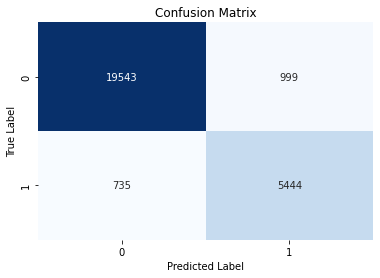

In [0]:
from pyspark.mllib.evaluation import MulticlassMetrics
import seaborn as sns

# Extracting predictions and labels as RDD
prediction_and_label = tuned_predictions.select("prediction", "Label").rdd.map(lambda row: (float(row.prediction), float(row.Label)))

# Instantiate MulticlassMetrics
metrics = MulticlassMetrics(prediction_and_label)

# Confusion Matrix
confusion_matrix = metrics.confusionMatrix().toArray()
sns.heatmap(confusion_matrix, annot=True, fmt=".0f", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.show()


In [0]:
#Model 2 - Electric Range

from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.regression import RandomForestRegressor
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import RegressionEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

# Select the necessary columns for analysis
selected_columns = df.select("Make", "Electric_Vehicle_Type", "Electric_Range")

# Drop rows with missing values in the target variable
selected_columns = selected_columns.dropna(subset=["Electric_Range"])

# Convert categorical variables to numerical indices
indexer_make = StringIndexer(inputCol="Make", outputCol="MakeIndex")
indexer_ev_type = StringIndexer(inputCol="Electric_Vehicle_Type", outputCol="EVTypeIndex")

# Assemble all features into one column "features"
assembler = VectorAssembler(inputCols=["MakeIndex", "EVTypeIndex"], outputCol="features")

In [0]:
# Use Random Forest Regressor model
regressor = RandomForestRegressor(featuresCol="features", labelCol="Electric_Range", numTrees=10, maxBins=40)

# Create a pipeline to execute steps in a specific sequence
pipeline = Pipeline(stages=[indexer_make, indexer_ev_type, assembler, regressor])

In [0]:
# Split data into training and testing sets
(train_data, test_data) = selected_columns.randomSplit([0.8, 0.2], seed=1234)

# Train the model on the training data
model = pipeline.fit(train_data)

# Make predictions on the test data
predictions = model.transform(test_data)

In [0]:
# Evaluate the model results
evaluator = RegressionEvaluator(labelCol="Electric_Range", predictionCol="prediction", metricName="rmse")
rmse = evaluator.evaluate(predictions)
print(f"Root Mean Squared Error (RMSE): {rmse}")

# View feature importances in the Random Forest model
feature_importances = model.stages[-1].featureImportances
print("Feature Importances:")
for i, importance in enumerate(feature_importances):
    print(f"Feature {i}: {importance}")

Root Mean Squared Error (RMSE): 92.22378721063956
Feature Importances:
Feature 0: 0.49296608584564766
Feature 1: 0.5070339141543524


In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator

evaluator = BinaryClassificationEvaluator(labelCol="Label", metricName="areaUnderROC")
auc_roc = evaluator.evaluate(tuned_predictions)
print(f"AUC-ROC: {auc_roc}")

AUC-ROC: 0.9747451957754846


In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Assuming you have a DataFrame 'tuned_predictions' with columns 'Label' and 'prediction'
evaluator = MulticlassClassificationEvaluator(labelCol="Label", predictionCol="prediction", metricName="f1")

# Evaluate the F1 Score
f1_score = evaluator.evaluate(tuned_predictions)
print(f"F1 Score: {f1_score}")

F1 Score: 0.9355760188731133


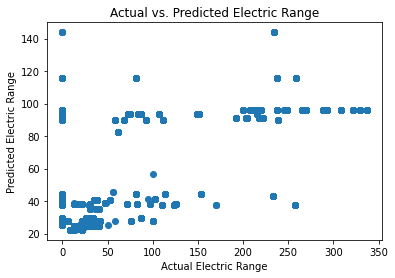

In [0]:
# Visualize the correlation matrix
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.mllib.evaluation import MulticlassMetrics
import seaborn as sns
import matplotlib.pyplot as plt

model_predictions = model.transform(test_data)
predictions_pd = model_predictions.select("Electric_Range", "prediction").toPandas()

plt.scatter(predictions_pd["Electric_Range"], predictions_pd["prediction"])
plt.xlabel("Actual Electric Range")
plt.ylabel("Predicted Electric Range")
plt.title("Actual vs. Predicted Electric Range")
plt.show()